<a href="https://colab.research.google.com/github/tmone/amr-system/blob/main/%5BSM%5D_Blood_Cell_Detect.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Blood Cell Recognition using AI: Technical Demonstration**

> 👥 StepMedia Sofware Dev Team



## Project Objectives
1. Demonstrate an automated system for blood cell recognition and classification
2. Showcase the accuracy and efficiency of our AI-powered solution
3. Present real-world applications and benefits in medical diagnostics

## Technical Demo

### I. Introduction: Blood cell analysis in medical diagnostics is a fundamental medical laboratory procedure that plays a crucial role in healthcare.

1. Key Components of Blood Cell Analysis:
- Complete Blood Count (CBC): Measures different types of blood cells:
- Red Blood Cells (RBCs/Erythrocytes): Carry oxygen throughout the body
- White Blood Cells (WBCs/Leukocytes): Fight infections and diseases
- Platelets (Thrombocytes): Help in blood clotting

2. Traditional Analysis Methods:
- Manual Microscopy: Laboratory technicians examine blood smears under microscopes
- Flow Cytometry: Automated analysis of cell populations
- Hematology Analyzers: Automated cell counting and classification

3. Clinical Significance:
- Disease Detection: Identifying conditions like anemia, infections, and leukemia
- Monitoring Treatment: Tracking patient response to various therapies
- Preventive Care: Regular health screenings and early disease detection
- Pre-surgical Assessment: Evaluating patient fitness for procedures

4. Key Parameters Analyzed:
- Cell Counts: Quantitative measurement of each cell type
- Morphology: Cell shape, size, and structural abnormalities
- Distribution: Proportion of different cell types
- Cell Maturity: Identifying immature or abnormal cells

## II. Dataset and Preprocessing:
- Dataset quality is crucial for the success of AI blood cell recognition demos. High-quality datasets lead to accurate models, reduced training time, and increased reliability during demonstrations. However, selecting appropriate datasets presents significant challenges: online datasets often lack source information, have inconsistent quality, and insufficient validation. This requires development teams to spend time on validation, prepare multiple backup scenarios, and maintain transparency about model limitations with clients
- We have carefully selected datasets from reputable sources that have been extensively validated by the research community and are licensed for research and model development. These datasets have been peer-reviewed, widely cited in academic publications, and are specifically permitted for AI training and demonstration purposes.
- [BloodCell yolo format](https://www.kaggle.com/datasets/quangnguynvnnn/bloodcell-yolo-format)

In [1]:
import kagglehub
bcd_datatset_path = kagglehub.dataset_download('quangnguynvnnn/bloodcell-yolo-format')

print('Data source import complete.')


Data source import complete.


### Dataset structure

In [2]:
import os
from pathlib import Path
import pandas as pd
from IPython.display import display, HTML

def display_yolo_structure(dataset_path):
    """
    Display the structure of a YOLO dataset including train/val/test splits,
    image counts, and label statistics.

    Args:
        dataset_path (str): Root path to the YOLO dataset
    """
    # Convert to Path object for easier handling
    root = Path(dataset_path)

    print("📁 YOLO Dataset Structure Analysis\n")

    # Initialize counters
    total_images = 0
    total_labels = 0
    splits_info = {}

    # Expected YOLO structure
    expected_dirs = ['train', 'valid', 'test']

    for split in expected_dirs:
        split_path = root / split
        if not split_path.exists():
            continue

        # Count images
        image_path = split_path / 'images'
        images = list(image_path.glob('*.jpg')) + list(image_path.glob('*.png'))
        num_images = len(images)

        # Count labels
        label_path = split_path / 'labels'
        labels = list(label_path.glob('*.txt'))
        num_labels = len(labels)

        splits_info[split] = {
            'images': num_images,
            'labels': num_labels
        }

        total_images += num_images
        total_labels += num_labels

    # Create a DataFrame for better visualization
    df = pd.DataFrame.from_dict(splits_info, orient='index')

    # Display summary
    print(f"Dataset Location: {root}\n")
    print("📊 Dataset Statistics:")
    print(f"Total Images: {total_images}")
    print(f"Total Labels: {total_labels}\n")

    print("📂 Split Distribution:")
    display(df.style.set_caption("Dataset Split Statistics")
            .format("{:,}")
            .background_gradient(cmap='Blues'))

    # Check dataset structure
    print("\n✔️ Dataset Structure Validation:")
    for split in expected_dirs:
        if (root / split).exists():
            print(f"\n{split}:")
            print(f"  ├── images/")
            print(f"  └── labels/")

            # Sample a few image names
            sample_images = list((root / split / 'images').glob('*.jpg'))[:3]
            if sample_images:
                print(f"      Sample images:")
                for img in sample_images:
                    print(f"      ├── {img.name}")

def analyze_yolo_labels(dataset_path, num_classes):
    """
    Analyze YOLO label distribution across classes

    Args:
        dataset_path (str): Root path to the YOLO dataset
        num_classes (int): Number of classes in the dataset
    """
    root = Path(dataset_path)
    class_counts = {i: 0 for i in range(num_classes)}

    print("\n📊 Label Distribution Analysis:")

    for split in ['train', 'valid', 'test']:
        label_path = root / split / 'labels'
        if not label_path.exists():
            continue

        for label_file in label_path.glob('*.txt'):
            with open(label_file, 'r') as f:
                for line in f:
                    class_id = int(line.split()[0])
                    class_counts[class_id] += 1

    # Create DataFrame for visualization
    df = pd.DataFrame.from_dict(class_counts, orient='index', columns=['Count'])
    df.index.name = 'Class ID'

    display(df.style.set_caption("Class Distribution")
            .format("{:,}")
            .background_gradient(cmap='Blues'))

# Example usage:
# display_yolo_structure('/content/dataset')
# analyze_yolo_labels('/content/dataset', num_classes=5)

In [3]:
display_yolo_structure(bcd_datatset_path)

📁 YOLO Dataset Structure Analysis

Dataset Location: /root/.cache/kagglehub/datasets/quangnguynvnnn/bloodcell-yolo-format/versions/1

📊 Dataset Statistics:
Total Images: 7950
Total Labels: 7950

📂 Split Distribution:


,images,labels
train,"6,000","6,000"
valid,"1,000","1,000"
test,950,950



✔️ Dataset Structure Validation:

train:
  ├── images/
  └── labels/
      Sample images:
      ├── BA_705900_jpg_jpg.rf.f4a4b79b42bc2ae3fe68f601d1e59f0e.jpg
      ├── LY_511879_jpg_jpg.rf.d5cc9335a1ab8af36ab7ebe001e1dada.jpg
      ├── LY_684028_jpg_jpg.rf.55cfc3c73c6478b3029abfb431e66a11.jpg

valid:
  ├── images/
  └── labels/
      Sample images:
      ├── PLATELET_430818_jpg_jpg.rf.ffd4f157b7763094d8621fa23699fcb0.jpg
      ├── EO_89877_jpg_jpg.rf.b0f4108bb80bd02161328c3682c4d9b4.jpg
      ├── MO_56423_jpg_jpg.rf.c49c7395cd8a1ab5d944b620b840ade1.jpg

test:
  ├── images/
  └── labels/
      Sample images:
      ├── BA_961010_jpg_jpg.rf.a875d8ebb199f61c3e3fac72a2c6542e.jpg
      ├── LY_130316_jpg_jpg.rf.008320ee8235f987a5bdaef9c37c95aa.jpg
      ├── BNE_64421_jpg_jpg.rf.66a820eea70606ef01cac21adac82fbd.jpg


### Introduction to the blood cell image dataset

In [4]:
from glob import glob
import os

HOME = "/kaggle/working"
def make_ds(root, path_to_copy):

    os.makedirs(path_to_copy, exist_ok = True)

    files = glob(f"{root}/*")
    for idx, file in enumerate(files):
        if os.path.isdir(file): os.system(f"cp -r '{file}' {path_to_copy}")
        elif os.path.isfile(file): os.system(f"cp '{file}' {path_to_copy}")

root = "/kaggle/input/blood-cell-detection-datatset"
make_ds(root = root, path_to_copy = f"{HOME}/datasets")

Data analysis is in process...

Data analysis is in process...

Data analysis is in process...



<ipython-input-5-a9a811b311b3>:105: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(cls_names)
<ipython-input-5-a9a811b311b3>:105: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(cls_names)
<ipython-input-5-a9a811b311b3>:105: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(cls_names)


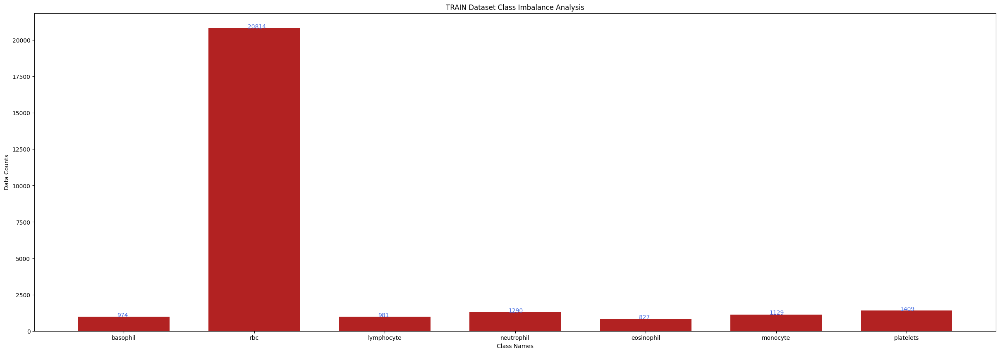

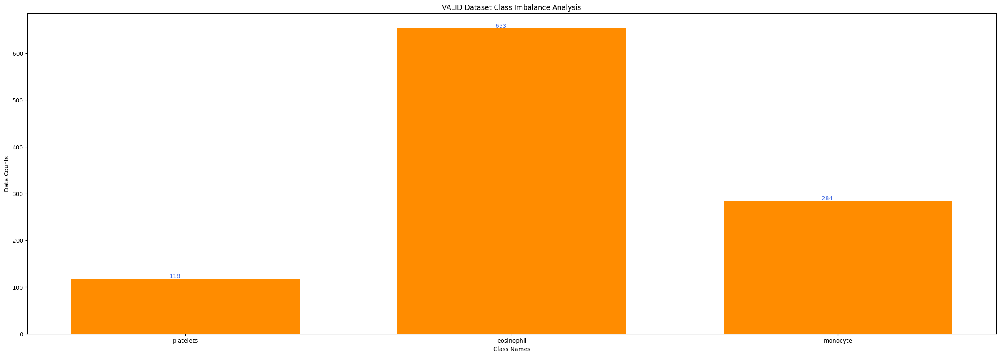

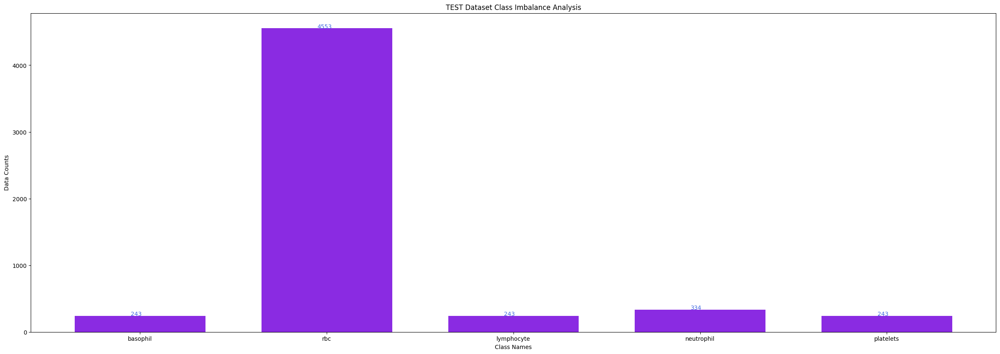

In [5]:
import cv2, yaml, random, numpy as np
from PIL import Image
from matplotlib import pyplot as plt
from torchvision import transforms as T

class Visualization:

    def __init__(self, data_types, n_ims, rows, cmap = None):

        self.n_ims, self.rows = n_ims, rows
        self.cmap, self.data_types  = cmap, data_types
        self.colors = ["firebrick", "darkorange", "blueviolet"]

        self.get_cls_names(); self.get_bboxes()

    def get_cls_names(self):

        with open(f"{bcd_datatset_path}/data.yaml", 'r') as file: data = yaml.safe_load(file)
        # Extract class names
        class_names = data['names']

        # Create a dictionary with index as key and class name as value
        self.class_dict = {index: name for index, name in enumerate(class_names)}

    def get_bboxes(self):

        self.vis_datas, self.analysis_datas, self.im_paths = {}, {}, {}
        for data_type in self.data_types:
            all_bboxes, all_analysis_datas = [], {}
            im_paths = glob(f"{bcd_datatset_path}/{data_type}/images/*")
            for idx, im_path in enumerate(im_paths):
                bboxes = []
                # if idx == 3: break
                lbl_path  = im_path.replace("images", "labels").replace(".jpg", ".txt")
                meta_data = open(lbl_path).readlines()
                for data in meta_data:
                    # Split the string by space and strip the newline character
                    # Change here
                    parts = data.strip().split()[:5]
                    cls_name = self.class_dict[int(parts[0])]
                    # Convert first element to integer and the rest to float
                    bboxes.append([cls_name] + [float(x) for x in parts[1:]])
                    if cls_name not in all_analysis_datas: all_analysis_datas[cls_name] = 1
                    else: all_analysis_datas[cls_name] += 1
                all_bboxes.append(bboxes)

            self.vis_datas[data_type] = all_bboxes; self.analysis_datas[data_type] = all_analysis_datas; self.im_paths[data_type] = im_paths

    def plot(self, rows, cols, count, im_path, bboxes):

        plt.subplot(rows, cols, count)
        or_im = np.array(Image.open(im_path).convert("RGB"))
        height, width, _ = or_im.shape

        for bbox in bboxes:

            class_id, x_center, y_center, w, h = bbox

            # Convert YOLO format to pixel values
            x_min = int((x_center - w / 2) * width)  # x_min
            y_min = int((y_center - h / 2) * height)  # y_min
            x_max = int((x_center + w / 2) * width)  # x_max
            y_max = int((y_center + h / 2) * height)  # y_max

            color = (random.randint(0, 255), random.randint(0, 255), random.randint(0, 255))
            cv2.rectangle(img = or_im, pt1 = (x_min, y_min), pt2 = (x_max, y_max), color = color, thickness = 3)
        plt.imshow(or_im)
        plt.axis("off"); plt.title(f"There are {len(bboxes)} objects in the image.")

        return count + 1

    def vis(self, save_name):

        print(f"{save_name.upper()} Data Visualization is in process...\n")
        assert self.cmap in ["rgb", "gray"], "Please choose rgb or gray cmap"
        if self.cmap == "rgb": cmap = "viridis"
        cols = self.n_ims // self.rows; count = 1

        plt.figure(figsize = (25, 20))

        indices = [random.randint(a = 0, b = len(self.vis_datas[save_name]) - 1) for _ in range(self.n_ims)]

        for idx, index in enumerate(indices):

            if count == self.n_ims + 1: break

            im_path, bboxes = self.im_paths[save_name][index], self.vis_datas[save_name][index]

            count = self.plot(self.rows, cols, count, im_path = im_path, bboxes = bboxes)

        plt.show()

    def data_analysis(self, save_name, color):

        print("Data analysis is in process...\n")

        width, text_width, text_height = 0.7, 0.05, 2
        cls_names = list(self.analysis_datas[save_name].keys()); counts = list(self.analysis_datas[save_name].values())

        _, ax = plt.subplots(figsize = (30, 10))
        indices = np.arange(len(counts))

        ax.bar(indices, counts, width, color = color)
        ax.set_xlabel("Class Names", color = "black")
        ax.set_xticklabels(cls_names)
        ax.set(xticks = indices, xticklabels = cls_names)
        ax.set_ylabel("Data Counts", color = "black")
        ax.set_title(f"{save_name.upper()} Dataset Class Imbalance Analysis")

        for i, v in enumerate(counts): ax.text(i - text_width, v + text_height, str(v), color = "royalblue")

    def visualization(self): [self.vis(save_name) for save_name in self.data_types]

    def analysis(self): [self.data_analysis(save_name, color) for (save_name, color) in zip(self.data_types, self.colors)]

vis = Visualization(data_types = ["train", "valid", "test"], n_ims = 20, rows = 5, cmap = "rgb")
vis.analysis()

TRAIN Data Visualization is in process...



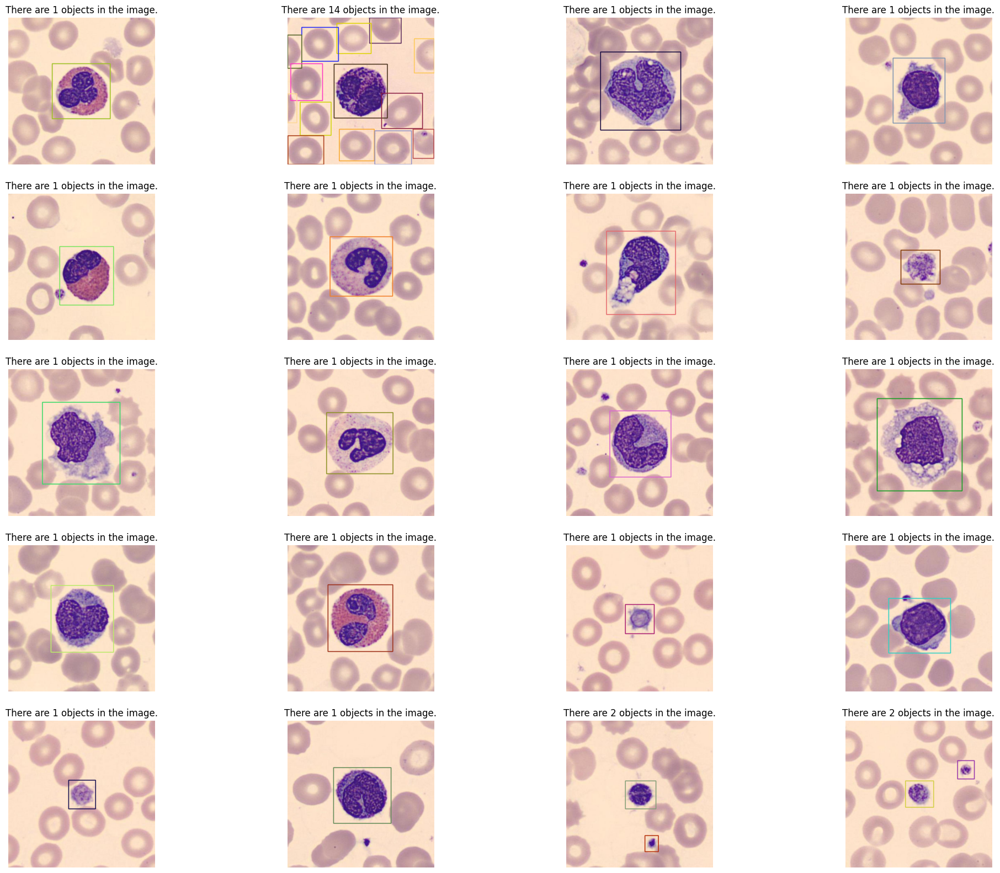

VALID Data Visualization is in process...



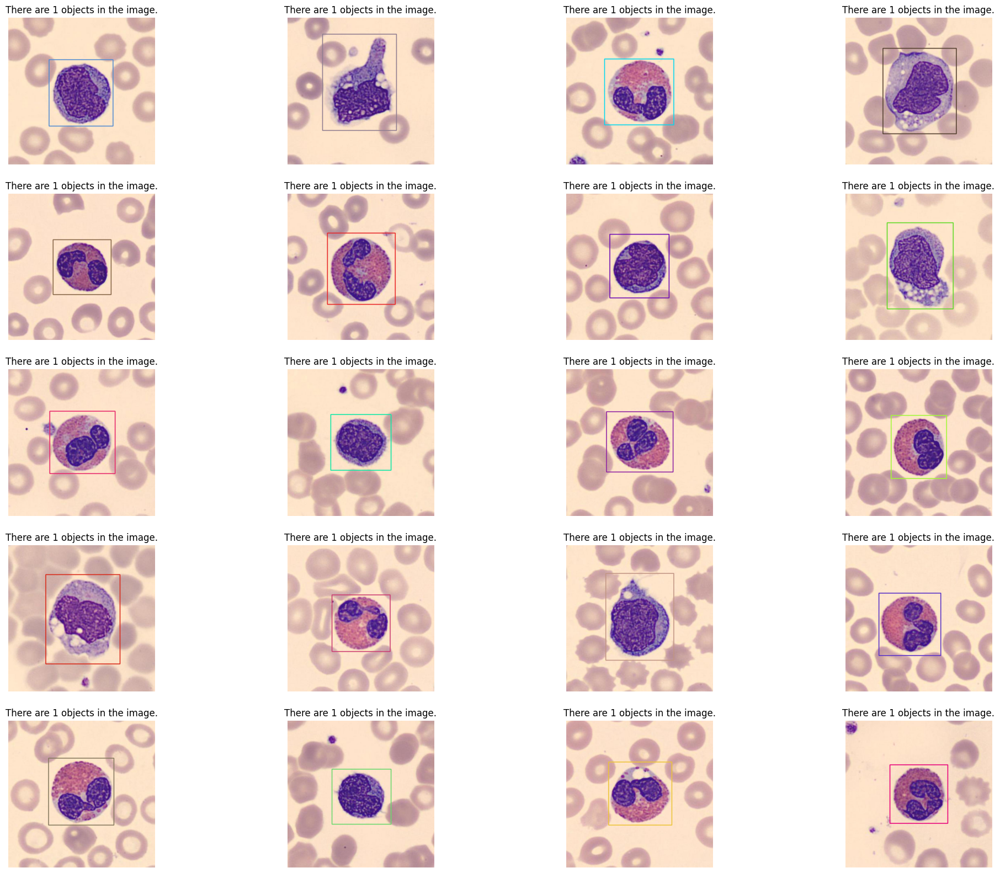

TEST Data Visualization is in process...



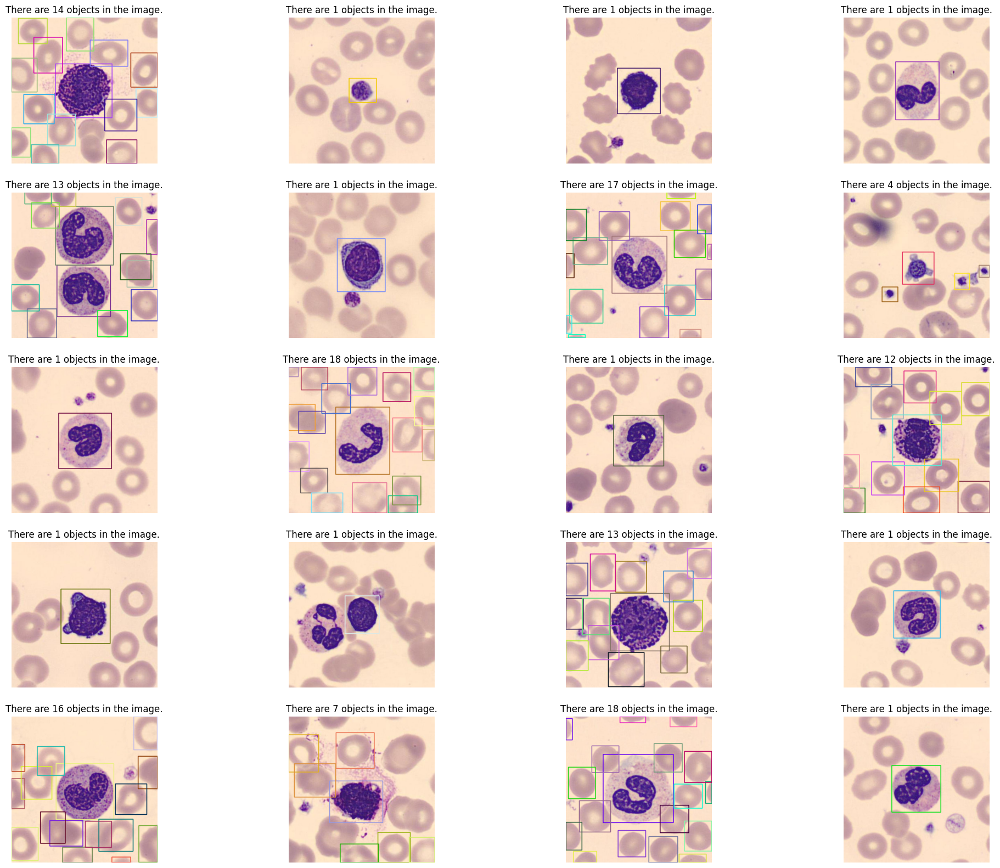

In [6]:
vis.visualization()

## III. Required Libraries and Dependencies
- Ultralytics YOLOv11: Latest version of the YOLO family, offering state-of-the-art performance for object detection

In [7]:
!pip install ultralytics
from ultralytics import YOLO
model = YOLO("yolo11n.pt")

## IV. Training process overview

- Google Colab Pro with A100 GPU for training 6000 images on train datasets (About 2-3 Hours to completed)

In [15]:
# Clear GPU memory and optimize CUDA before training
import torch
import gc
torch.cuda.empty_cache()
gc.collect()

# Set CUDA settings for optimal batch size computation
torch.backends.cudnn.benchmark = False  # Required for AutoBatch
torch.backends.cuda.matmul.allow_tf32 = True

# Start training with optimized parameters
train_results = model.train(
    data=f"{bcd_datatset_path}/data.yaml",  # Path to dataset YAML
    epochs=100,                             # Number of training epochs
    imgsz=480,                             # Training image size
    device=0,                              # GPU device selection

    # Training checkpoints and saving
    patience=50,                           # Early stopping patience
    save=True,                            # Save training results
    exist_ok=True,                        # Overwrite existing files
    save_period=10,                       # Save checkpoint every N epochs

    # Model configuration
    pretrained=True,                      # Use pretrained weights
    verbose=True,                         # Display detailed training info

    # Learning rate and optimization
    lr0=0.001,                           # Initial learning rate
    weight_decay=0.0005,                 # Weight decay for regularization
    warmup_epochs=3,                     # Gradual warmup epochs
    optimizer='AdamW',                   # Advanced optimizer
    cos_lr=True,                         # Cosine learning rate schedule

    # Memory and performance optimization
    batch=16,                            # Fixed batch size based on warning
    workers=8,                           # Reduced workers to save RAM
    cache='disk',                        # Cache to disk for deterministic results
    amp=True,                            # Automatic mixed precision
    half=True,                           # Use FP16 (half precision)

    # Data augmentation (balanced for performance)
    augment=True,                        # Enable augmentation
    mosaic=0.3,                          # Moderate mosaic augmentation
    mixup=0.2,                           # Moderate mixup augmentation
    close_mosaic=10,                     # Disable mosaic in final epochs

    # Advanced performance settings
    multi_scale=True,                    # Multi-scale training
    nbs=64,                             # Nominal batch size
    rect=False,                          # Disable rectangular training for shuffle
    profile=True,                       # Profile CUDA operations
    overlap_mask=True,                  # Overlap mask augmentation

    # Memory saving options
    max_det=300,                        # Maximum detections per image
    nms=True,                          # Use Non-Maximum Suppression
    plots=False,                       # Disable plotting to save RAM

    # Project organization
    project='runs/detect',             # Project directory
    name='train'                       # Run name
)

Ultralytics 8.3.73 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
engine/trainer: task=detect, mode=train, model=yolo11n.pt, data=/root/.cache/kagglehub/datasets/quangnguynvnnn/bloodcell-yolo-format/versions/1/data.yaml, epochs=100, time=None, patience=50, batch=16, imgsz=480, save=True, save_period=10, cache=disk, device=0, workers=8, project=runs/detect, name=train, exist_ok=True, pretrained=True, optimizer=AdamW, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=True, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=True, freeze=None, multi_scale=True, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=True, dnn=False, plots=False, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=True, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False

train: Scanning /root/.cache/kagglehub/datasets/quangnguynvnnn/bloodcell-yolo-format/versions/1/train/labels.cache... 6000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 6000/6000 [00:00<?, ?it/s]
train: Caching images (11.8GB Disk): 100%|██████████| 6000/6000 [04:44<00:00, 21.06it/s] 

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /root/.cache/kagglehub/datasets/quangnguynvnnn/bloodcell-yolo-format/versions/1/valid/labels.cache... 1000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1000/1000 [00:00<?, ?it/s]
val: Caching images (2.0GB Disk): 100%|██████████| 1000/1000 [00:08<00:00, 116.20it/s]


optimizer: AdamW(lr=0.001, momentum=0.937) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 480 train, 480 val
Using 8 dataloader workers
Logging results to runs/detect/train
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      3.44G     0.9202      1.422      1.157         52        288: 100%|██████████| 375/375 [00:47<00:00,  7.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.21it/s]


                   all       1000       1055      0.908      0.884      0.979      0.852

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      3.72G     0.8049      1.063      1.071        111        288: 100%|██████████| 375/375 [00:45<00:00,  8.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.37it/s]

                   all       1000       1055      0.955      0.985       0.99      0.877



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      3.61G     0.7824      1.005      1.046         88        704: 100%|██████████| 375/375 [00:42<00:00,  8.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.29it/s]

                   all       1000       1055      0.962      0.974      0.986      0.864



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      3.73G     0.7572     0.9452      1.035         44        448: 100%|██████████| 375/375 [00:42<00:00,  8.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.33it/s]

                   all       1000       1055      0.974      0.982       0.99      0.864



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      3.84G     0.7544     0.9194      1.029         77        384: 100%|██████████| 375/375 [00:41<00:00,  8.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.58it/s]

                   all       1000       1055      0.978      0.991      0.992      0.881



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      3.67G     0.7456     0.9008      1.024        131        512: 100%|██████████| 375/375 [00:42<00:00,  8.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.17it/s]

                   all       1000       1055      0.984      0.984       0.99       0.88



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      3.34G     0.7384     0.8857      1.016         88        576: 100%|██████████| 375/375 [00:41<00:00,  8.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.05it/s]

                   all       1000       1055      0.974      0.986       0.99      0.881



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      3.77G     0.7416     0.8992      1.019        121        576: 100%|██████████| 375/375 [00:42<00:00,  8.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.45it/s]

                   all       1000       1055      0.985       0.99      0.991      0.884



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      3.85G     0.7283     0.8714       1.01        126        448: 100%|██████████| 375/375 [00:42<00:00,  8.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.35it/s]

                   all       1000       1055      0.976      0.975      0.989      0.873



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      3.37G     0.7271     0.8578      1.008         79        512: 100%|██████████| 375/375 [00:42<00:00,  8.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.32it/s]

                   all       1000       1055      0.978      0.974      0.989      0.871



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      4.26G     0.7296     0.8598      1.011        100        480: 100%|██████████| 375/375 [00:41<00:00,  8.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.40it/s]

                   all       1000       1055      0.985      0.987      0.992      0.881



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      3.75G     0.7111     0.8343          1         62        736: 100%|██████████| 375/375 [00:41<00:00,  8.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.22it/s]

                   all       1000       1055      0.982      0.982      0.991      0.883



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      3.77G       0.72     0.8529      1.005         63        512: 100%|██████████| 375/375 [00:41<00:00,  8.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.34it/s]

                   all       1000       1055      0.977      0.991      0.991       0.88



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      3.42G     0.7169     0.8377      1.007         63        416: 100%|██████████| 375/375 [00:42<00:00,  8.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.36it/s]

                   all       1000       1055      0.987      0.986      0.991      0.887



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      3.36G     0.7125     0.8282     0.9988        132        448: 100%|██████████| 375/375 [00:42<00:00,  8.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.63it/s]


                   all       1000       1055      0.982      0.993      0.991      0.883

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      4.14G     0.7021     0.8054     0.9914         39        320: 100%|██████████| 375/375 [00:41<00:00,  8.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.51it/s]

                   all       1000       1055      0.987      0.987       0.99      0.883



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      3.73G     0.7015     0.8182     0.9949         83        416: 100%|██████████| 375/375 [00:42<00:00,  8.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.44it/s]

                   all       1000       1055      0.977      0.984       0.99      0.887



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      3.69G     0.7066     0.8188      1.003        192        256: 100%|██████████| 375/375 [00:42<00:00,  8.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.28it/s]

                   all       1000       1055      0.981      0.987      0.992      0.884



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      3.75G     0.6982     0.8098     0.9926         57        480: 100%|██████████| 375/375 [00:42<00:00,  8.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.25it/s]

                   all       1000       1055       0.98       0.99       0.99      0.884



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      4.13G     0.7025     0.8062     0.9929        103        416: 100%|██████████| 375/375 [00:41<00:00,  8.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.36it/s]

                   all       1000       1055      0.964      0.984      0.987      0.884



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      4.53G     0.6995      0.796     0.9897         59        736: 100%|██████████| 375/375 [00:42<00:00,  8.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.19it/s]

                   all       1000       1055      0.978      0.986      0.989       0.89



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      3.62G     0.6982     0.7987     0.9954         59        640: 100%|██████████| 375/375 [00:42<00:00,  8.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.37it/s]

                   all       1000       1055      0.975      0.984       0.99      0.886



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      3.39G      0.696     0.7892     0.9888        102        608: 100%|██████████| 375/375 [00:42<00:00,  8.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.42it/s]

                   all       1000       1055      0.987      0.986      0.992      0.888



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      3.76G     0.6891     0.7825     0.9873        150        352: 100%|██████████| 375/375 [00:41<00:00,  8.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.46it/s]

                   all       1000       1055      0.981       0.99      0.992      0.892



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      4.21G     0.6882     0.7757     0.9832        101        608: 100%|██████████| 375/375 [00:41<00:00,  8.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.28it/s]

                   all       1000       1055      0.987       0.99      0.992      0.894



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      4.25G     0.6882     0.7822     0.9915        127        256: 100%|██████████| 375/375 [00:42<00:00,  8.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.33it/s]

                   all       1000       1055       0.98      0.988      0.992      0.893



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      3.96G     0.6886     0.7752      0.987         82        480: 100%|██████████| 375/375 [00:42<00:00,  8.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.57it/s]

                   all       1000       1055      0.983      0.978      0.992      0.892



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100       3.9G     0.6876     0.7677     0.9909        100        512: 100%|██████████| 375/375 [00:42<00:00,  8.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.41it/s]

                   all       1000       1055      0.987      0.992      0.993      0.892



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100       3.3G       0.69      0.773     0.9869         79        704: 100%|██████████| 375/375 [00:42<00:00,  8.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.52it/s]

                   all       1000       1055      0.987      0.978      0.991       0.89



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      3.46G     0.6835     0.7821     0.9871         86        640: 100%|██████████| 375/375 [00:41<00:00,  8.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.42it/s]

                   all       1000       1055      0.979      0.988      0.992       0.89



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      3.97G     0.6805     0.7617     0.9804        108        672: 100%|██████████| 375/375 [00:41<00:00,  9.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.67it/s]

                   all       1000       1055       0.98      0.986      0.991      0.883



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      4.04G     0.6838     0.7616     0.9816         79        416: 100%|██████████| 375/375 [00:42<00:00,  8.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.42it/s]

                   all       1000       1055      0.974      0.988      0.991      0.896



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      3.38G     0.6769     0.7629      0.985         88        672: 100%|██████████| 375/375 [00:42<00:00,  8.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.16it/s]

                   all       1000       1055      0.975      0.985      0.992      0.893



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      3.63G     0.6743     0.7649      0.976        114        544: 100%|██████████| 375/375 [00:42<00:00,  8.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.50it/s]

                   all       1000       1055       0.98      0.983      0.992      0.894



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100       3.7G     0.6698     0.7472     0.9759        147        544: 100%|██████████| 375/375 [00:42<00:00,  8.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.40it/s]

                   all       1000       1055      0.988      0.984      0.992      0.892



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      3.74G     0.6773     0.7491     0.9804        109        704: 100%|██████████| 375/375 [00:41<00:00,  8.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.56it/s]

                   all       1000       1055      0.987      0.986      0.993      0.893



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      3.95G     0.6698     0.7483     0.9747         71        416: 100%|██████████| 375/375 [00:42<00:00,  8.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.34it/s]

                   all       1000       1055       0.99      0.978      0.992      0.892



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      3.71G      0.674      0.746     0.9719         68        416: 100%|██████████| 375/375 [00:42<00:00,  8.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.51it/s]

                   all       1000       1055      0.976      0.978      0.992      0.894



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      4.95G      0.668     0.7445     0.9688        194        384: 100%|██████████| 375/375 [00:42<00:00,  8.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.41it/s]

                   all       1000       1055      0.979       0.99      0.992      0.897



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      3.92G     0.6674     0.7332      0.976         91        512: 100%|██████████| 375/375 [00:41<00:00,  8.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.37it/s]

                   all       1000       1055       0.98      0.989      0.992      0.895



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      3.88G     0.6707     0.7332     0.9705         83        480: 100%|██████████| 375/375 [00:41<00:00,  8.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.27it/s]

                   all       1000       1055      0.989      0.987      0.992      0.895



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      3.74G     0.6719      0.746     0.9798         95        480: 100%|██████████| 375/375 [00:42<00:00,  8.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.45it/s]

                   all       1000       1055      0.983      0.984      0.992      0.896



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      3.46G     0.6631     0.7314     0.9747        131        736: 100%|██████████| 375/375 [00:42<00:00,  8.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.59it/s]

                   all       1000       1055      0.987      0.984      0.992      0.895



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      3.82G     0.6666     0.7355     0.9692         88        288: 100%|██████████| 375/375 [00:41<00:00,  8.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.45it/s]

                   all       1000       1055      0.987      0.984      0.993        0.9



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      3.74G     0.6593     0.7179     0.9758         70        416: 100%|██████████| 375/375 [00:42<00:00,  8.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.43it/s]

                   all       1000       1055      0.981      0.994      0.992      0.897



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100         4G     0.6637     0.7285     0.9703        106        416: 100%|██████████| 375/375 [00:41<00:00,  9.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.29it/s]

                   all       1000       1055      0.989      0.978      0.992      0.897



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      3.79G     0.6579     0.7165     0.9736        134        384: 100%|██████████| 375/375 [00:42<00:00,  8.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.18it/s]


                   all       1000       1055      0.986      0.993      0.992        0.9

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      3.56G     0.6611     0.7223      0.973        199        320: 100%|██████████| 375/375 [00:42<00:00,  8.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.37it/s]

                   all       1000       1055      0.983      0.993      0.993        0.9



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      3.71G     0.6566     0.7187      0.974        107        416: 100%|██████████| 375/375 [00:42<00:00,  8.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.58it/s]

                   all       1000       1055      0.989      0.992      0.993      0.897



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      3.72G     0.6533     0.7076     0.9745         71        320: 100%|██████████| 375/375 [00:42<00:00,  8.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.67it/s]

                   all       1000       1055      0.983      0.981      0.992      0.897



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      3.77G     0.6601     0.7177     0.9696        125        544: 100%|██████████| 375/375 [00:42<00:00,  8.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.16it/s]

                   all       1000       1055      0.988       0.98      0.992      0.899



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      3.76G     0.6572     0.7186     0.9703        118        544: 100%|██████████| 375/375 [00:42<00:00,  8.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.38it/s]

                   all       1000       1055      0.983      0.993      0.991      0.898



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      3.31G     0.6471     0.6956     0.9648         72        512: 100%|██████████| 375/375 [00:41<00:00,  8.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.40it/s]

                   all       1000       1055      0.982      0.994      0.993      0.899



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      4.36G     0.6529     0.7056     0.9712        158        224: 100%|██████████| 375/375 [00:42<00:00,  8.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.48it/s]

                   all       1000       1055      0.974      0.984      0.991      0.901



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      3.38G     0.6482     0.6965     0.9653         79        640: 100%|██████████| 375/375 [00:42<00:00,  8.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.50it/s]

                   all       1000       1055      0.981      0.986      0.992      0.901



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100       3.3G     0.6527     0.7044      0.964        109        512: 100%|██████████| 375/375 [00:41<00:00,  8.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.51it/s]

                   all       1000       1055      0.976      0.991      0.992      0.898



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      3.38G     0.6437     0.6977     0.9602        143        320: 100%|██████████| 375/375 [00:41<00:00,  8.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.32it/s]

                   all       1000       1055      0.988      0.982      0.992      0.902



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      4.09G     0.6444     0.6962     0.9608        126        704: 100%|██████████| 375/375 [00:41<00:00,  8.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.58it/s]

                   all       1000       1055       0.98      0.982      0.991      0.897



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      3.45G      0.645     0.6902       0.97        136        512: 100%|██████████| 375/375 [00:42<00:00,  8.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.57it/s]

                   all       1000       1055      0.979      0.994      0.993      0.903



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      3.81G     0.6501     0.6941     0.9629        117        288: 100%|██████████| 375/375 [00:42<00:00,  8.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.49it/s]

                   all       1000       1055      0.982      0.988      0.993      0.902



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      3.73G     0.6445      0.693     0.9689        117        576: 100%|██████████| 375/375 [00:42<00:00,  8.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.46it/s]


                   all       1000       1055      0.983      0.987      0.993      0.903

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      3.96G     0.6401     0.6883     0.9637        141        704: 100%|██████████| 375/375 [00:42<00:00,  8.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.31it/s]

                   all       1000       1055      0.986      0.976      0.992      0.904



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      3.39G     0.6386     0.6891      0.961        106        448: 100%|██████████| 375/375 [00:42<00:00,  8.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.48it/s]

                   all       1000       1055      0.979      0.993      0.992      0.904



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      4.64G     0.6347     0.6815     0.9563         94        352: 100%|██████████| 375/375 [00:42<00:00,  8.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.34it/s]


                   all       1000       1055      0.975      0.993      0.992      0.902

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      4.35G     0.6379     0.6821     0.9594         56        512: 100%|██████████| 375/375 [00:42<00:00,  8.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.29it/s]

                   all       1000       1055      0.983      0.984      0.992      0.901



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      3.79G     0.6388     0.6784     0.9661         82        672: 100%|██████████| 375/375 [00:43<00:00,  8.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.64it/s]

                   all       1000       1055      0.982      0.979      0.991      0.901



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      3.88G     0.6364     0.6798     0.9584        129        416: 100%|██████████| 375/375 [00:42<00:00,  8.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.31it/s]

                   all       1000       1055      0.979      0.984      0.991        0.9



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      3.31G     0.6331     0.6847     0.9584         90        640: 100%|██████████| 375/375 [00:42<00:00,  8.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.43it/s]

                   all       1000       1055      0.978       0.99      0.993      0.901



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      3.65G     0.6283     0.6712      0.958         80        512: 100%|██████████| 375/375 [00:42<00:00,  8.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.54it/s]

                   all       1000       1055      0.981      0.986      0.992      0.898



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      3.73G     0.6311     0.6751     0.9643        113        224: 100%|██████████| 375/375 [00:42<00:00,  8.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.38it/s]

                   all       1000       1055      0.978      0.991      0.993        0.9



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      3.43G     0.6293     0.6747     0.9565        124        320: 100%|██████████| 375/375 [00:42<00:00,  8.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.27it/s]

                   all       1000       1055      0.977      0.991      0.993      0.904



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      4.89G     0.6329     0.6825     0.9641        156        288: 100%|██████████| 375/375 [00:42<00:00,  8.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.48it/s]

                   all       1000       1055      0.987      0.983      0.993      0.902



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      3.79G     0.6275     0.6516     0.9556        115        320: 100%|██████████| 375/375 [00:42<00:00,  8.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.40it/s]

                   all       1000       1055      0.977      0.992      0.993        0.9



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      3.55G     0.6299     0.6728      0.958         90        704: 100%|██████████| 375/375 [00:42<00:00,  8.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.40it/s]

                   all       1000       1055      0.982      0.982      0.992      0.901



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      3.57G     0.6285       0.66     0.9652         69        608: 100%|██████████| 375/375 [00:42<00:00,  8.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.28it/s]

                   all       1000       1055      0.986      0.986      0.993      0.904



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      3.78G     0.6276     0.6643     0.9583         77        384: 100%|██████████| 375/375 [00:42<00:00,  8.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.04it/s]

                   all       1000       1055       0.98      0.989      0.993      0.904



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      3.34G     0.6266      0.661     0.9562        138        576: 100%|██████████| 375/375 [00:42<00:00,  8.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.36it/s]

                   all       1000       1055       0.98      0.993      0.993      0.904



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      4.09G     0.6218     0.6585      0.953         82        352: 100%|██████████| 375/375 [00:42<00:00,  8.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.56it/s]

                   all       1000       1055      0.976      0.992      0.993      0.903



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      3.92G     0.6217      0.657     0.9551         99        224: 100%|██████████| 375/375 [00:42<00:00,  8.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.44it/s]

                   all       1000       1055      0.985      0.985      0.993      0.901



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      3.79G     0.6247     0.6629     0.9499        115        448: 100%|██████████| 375/375 [00:42<00:00,  8.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.46it/s]

                   all       1000       1055      0.989      0.987      0.993      0.902



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      3.31G      0.619     0.6581      0.951         77        352: 100%|██████████| 375/375 [00:42<00:00,  8.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.34it/s]

                   all       1000       1055       0.98      0.993      0.993      0.901



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      3.38G     0.6233     0.6671     0.9539         89        480: 100%|██████████| 375/375 [00:42<00:00,  8.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.28it/s]

                   all       1000       1055      0.979      0.993      0.993      0.902



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      3.87G     0.6248     0.6615     0.9535        128        288: 100%|██████████| 375/375 [00:42<00:00,  8.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.42it/s]

                   all       1000       1055      0.979      0.992      0.993      0.902



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      3.97G     0.6265      0.663     0.9509        140        416: 100%|██████████| 375/375 [00:41<00:00,  8.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.41it/s]

                   all       1000       1055      0.978      0.992      0.993      0.901



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      3.49G     0.6229      0.653     0.9506         95        576: 100%|██████████| 375/375 [00:42<00:00,  8.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.57it/s]

                   all       1000       1055      0.978      0.991      0.993      0.901



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      3.66G     0.6266     0.6647     0.9571        118        384: 100%|██████████| 375/375 [00:43<00:00,  8.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.38it/s]

                   all       1000       1055      0.983      0.986      0.993      0.902



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100         4G     0.6184     0.6564     0.9558         92        288: 100%|██████████| 375/375 [00:43<00:00,  8.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.36it/s]

                   all       1000       1055      0.981       0.99      0.993      0.902



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      3.51G     0.6252     0.6537     0.9522        102        640: 100%|██████████| 375/375 [00:41<00:00,  8.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.29it/s]

                   all       1000       1055      0.982      0.989      0.993      0.902



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      3.74G     0.6201     0.6579     0.9505        108        672: 100%|██████████| 375/375 [00:42<00:00,  8.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.58it/s]

                   all       1000       1055       0.98       0.99      0.993      0.902



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      3.95G     0.6171       0.65     0.9478         89        512: 100%|██████████| 375/375 [00:41<00:00,  8.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.44it/s]

                   all       1000       1055      0.982      0.991      0.993      0.901


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      3.73G     0.5443     0.5101     0.9049         47        288: 100%|██████████| 375/375 [00:41<00:00,  8.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.52it/s]

                   all       1000       1055      0.981       0.99      0.993      0.902



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      3.72G     0.5422     0.5075     0.9067         70        544: 100%|██████████| 375/375 [00:41<00:00,  8.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.40it/s]

                   all       1000       1055      0.982      0.989      0.993      0.903



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      4.05G     0.5388     0.5041     0.9074         67        576: 100%|██████████| 375/375 [00:42<00:00,  8.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.35it/s]

                   all       1000       1055      0.983       0.99      0.993      0.902



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      4.22G      0.538      0.504     0.9141         94        544: 100%|██████████| 375/375 [00:42<00:00,  8.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.33it/s]

                   all       1000       1055      0.983      0.989      0.993      0.905



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      3.87G     0.5379     0.5047     0.9052         85        480: 100%|██████████| 375/375 [00:41<00:00,  9.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.48it/s]

                   all       1000       1055      0.984      0.989      0.993      0.904



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      3.27G     0.5381     0.4983     0.9072         52        736: 100%|██████████| 375/375 [00:41<00:00,  9.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.65it/s]

                   all       1000       1055      0.984      0.989      0.993      0.903



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      3.76G     0.5395     0.5033     0.9033         62        608: 100%|██████████| 375/375 [00:41<00:00,  8.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.25it/s]

                   all       1000       1055      0.981       0.99      0.993      0.902



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100       3.8G     0.5372     0.4984     0.9078         98        512: 100%|██████████| 375/375 [00:41<00:00,  8.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:04<00:00,  7.98it/s]

                   all       1000       1055      0.981       0.99      0.993      0.903



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      3.72G     0.5384     0.5047     0.9084         45        576: 100%|██████████| 375/375 [00:41<00:00,  8.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.27it/s]

                   all       1000       1055      0.981       0.99      0.993      0.903



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      3.98G     0.5361     0.4975     0.9107         41        416: 100%|██████████| 375/375 [00:41<00:00,  9.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.39it/s]

                   all       1000       1055      0.982       0.99      0.993      0.903



100 epochs completed in 1.304 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 5.5MB
Optimizer stripped from runs/detect/train/weights/best.pt, 5.5MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.73 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
YOLO11n summary (fused): 238 layers, 2,583,517 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:04<00:00,  6.46it/s]

                   all       1000       1055      0.984      0.991      0.992      0.903
            eosinophil        646        653      0.998      0.989      0.994      0.967
              monocyte        282        284      0.992      0.993      0.995      0.943
             platelets         72        118       0.96      0.992      0.988      0.798
Speed: 0.1ms preprocess, 2.3ms inference, 0.0ms loss, 0.7ms postprocess per image


## V. Reviewing model trained

In [17]:
Image.open(f"runs/detect/train/confusion_matrix.png")

FileNotFoundError: [Errno 2] No such file or directory: 'runs/detect/train/confusion_matrix.png'

In [ ]:
Image.open(f"runs/detect/train/results.png")

In [ ]:
Image.open(f"runs/detect/train/P_curve.png")

In [ ]:
Image.open(f"runs/detect/train/PR_curve.png")

In [ ]:
Image.open(f"runs/detect/train/val_batch0_pred.jpg")

## VI. Verify all images in the test dataset folde

In [18]:
inference_results = model(f"{bcd_datatset_path}/test/images")


image 1/950 /root/.cache/kagglehub/datasets/quangnguynvnnn/bloodcell-yolo-format/versions/1/test/images/BA_24200302_jpg_jpg.rf.2244a31fa8ce7ad28252d094e11b6be6.jpg: 480x480 1 basophil, 18 rbcs, 225.7ms
image 2/950 /root/.cache/kagglehub/datasets/quangnguynvnnn/bloodcell-yolo-format/versions/1/test/images/BA_799771_jpg_jpg.rf.3f2952a31f4942e2bcc7d543ca9c7f31.jpg: 480x480 1 basophil, 13 rbcs, 39.7ms
image 3/950 /root/.cache/kagglehub/datasets/quangnguynvnnn/bloodcell-yolo-format/versions/1/test/images/BA_800221_jpg_jpg.rf.c6a4069314d5841ae175afeb7fedd7a5.jpg: 480x480 1 basophil, 19 rbcs, 36.3ms
image 4/950 /root/.cache/kagglehub/datasets/quangnguynvnnn/bloodcell-yolo-format/versions/1/test/images/BA_800475_jpg_jpg.rf.7cc7ad533169fc3a0061c88660e9bb04.jpg: 480x480 1 basophil, 18 rbcs, 34.6ms
image 5/950 /root/.cache/kagglehub/datasets/quangnguynvnnn/bloodcell-yolo-format/versions/1/test/images/BA_801290_jpg_jpg.rf.b250acb835b7a0b32fe279cd243a782e.jpg: 480x480 1 basophil, 16 rbcs, 34.7ms
i

### Result of testing

Image#1


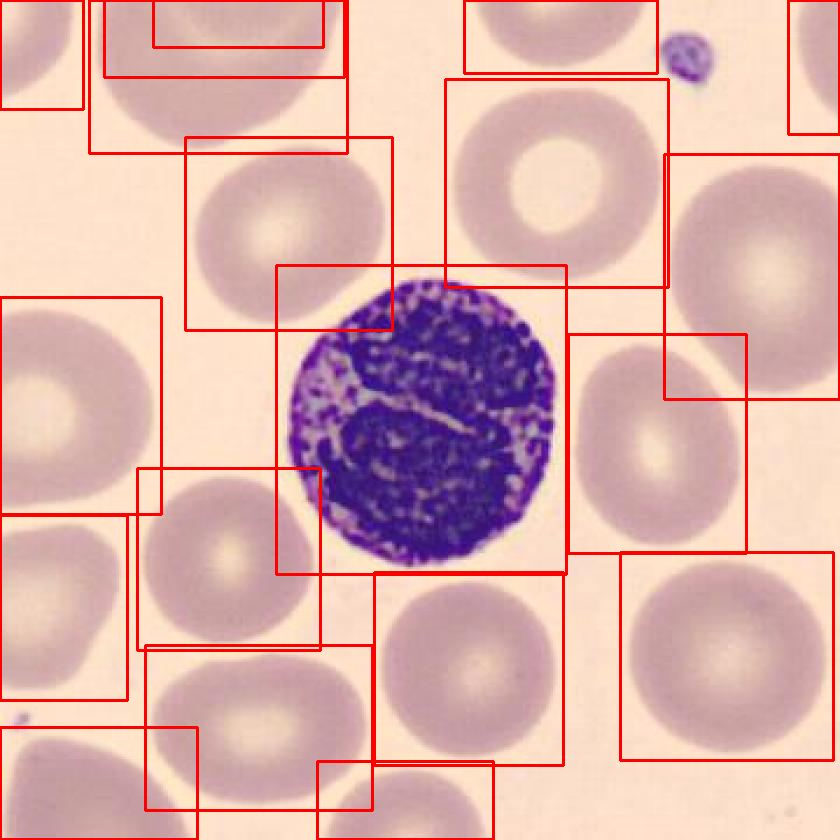

Image#2


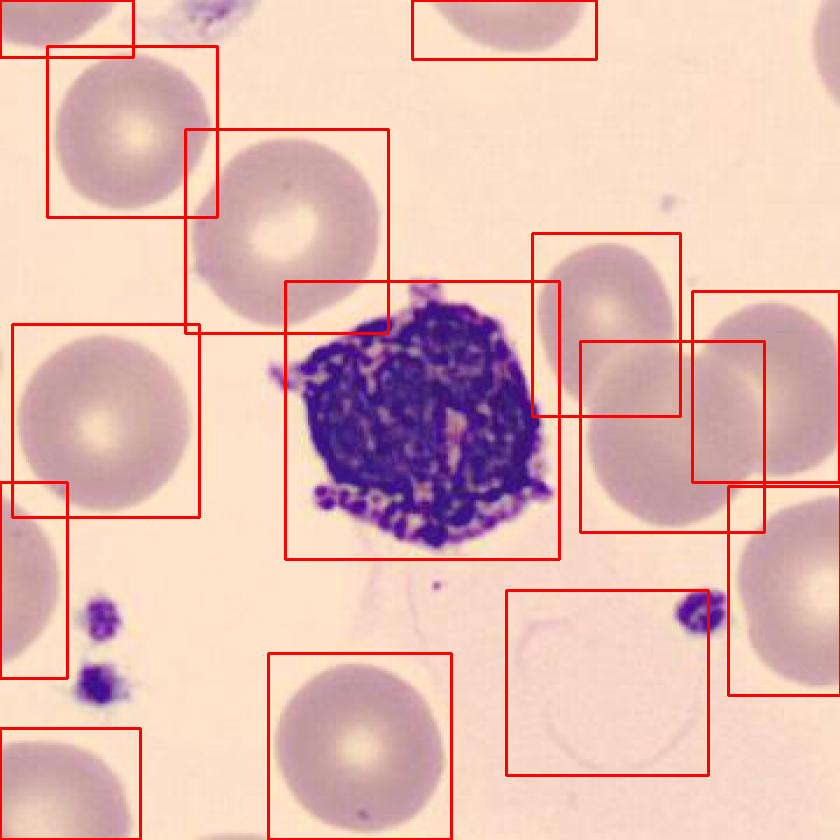

Image#3


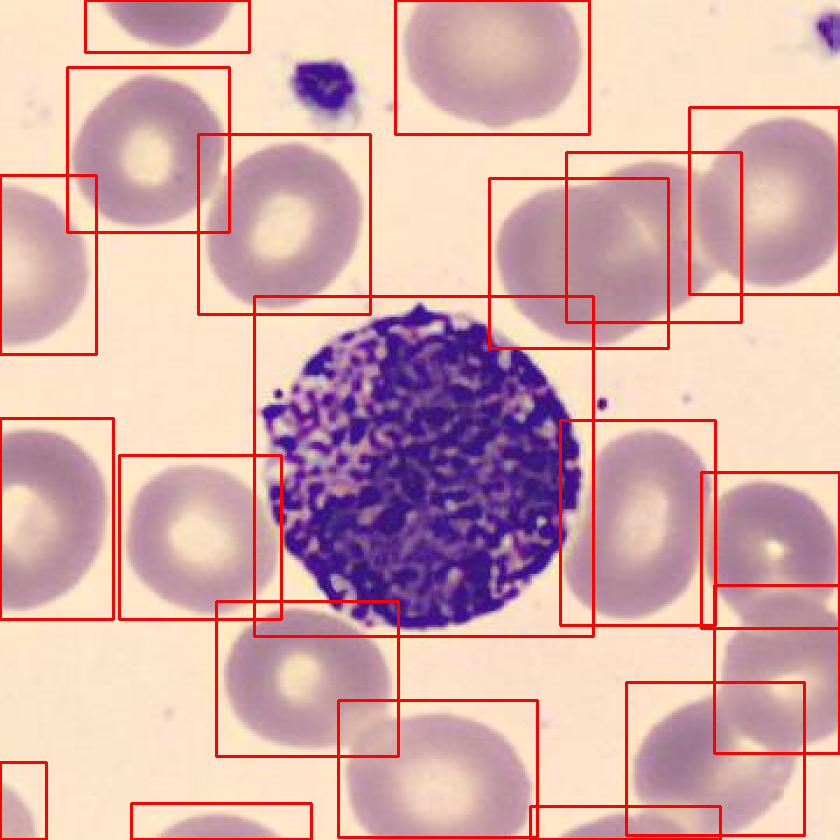

Image#4


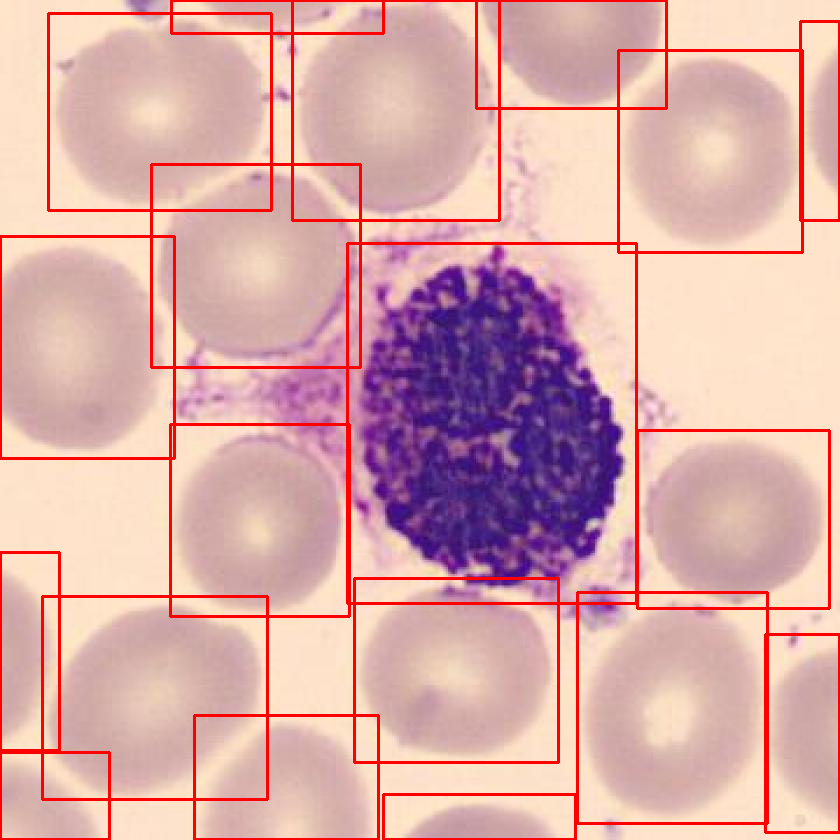

Image#5


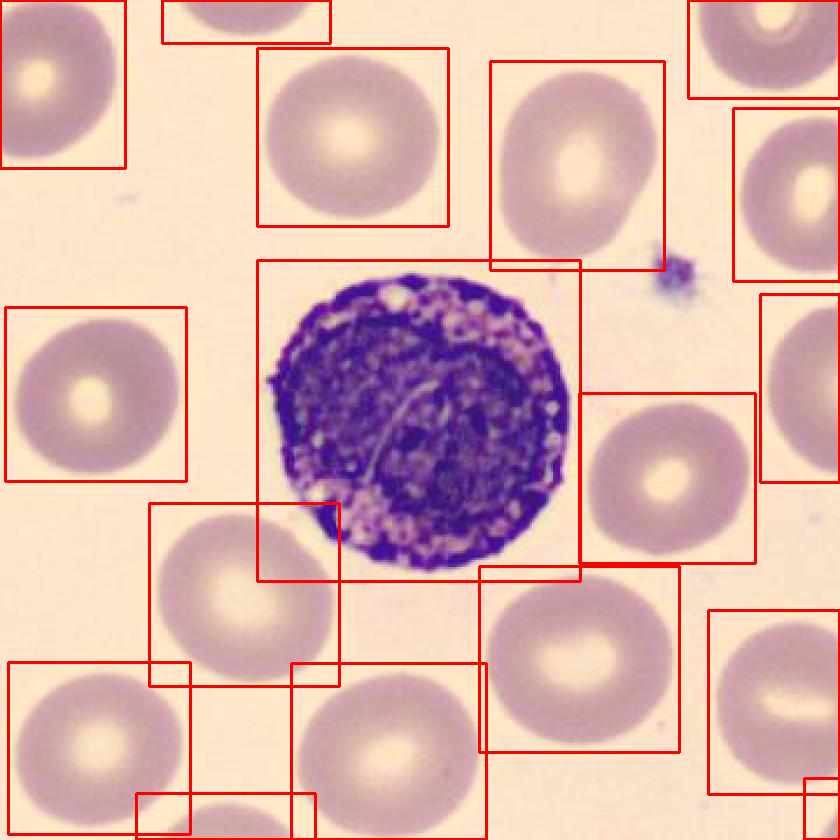

In [19]:
for idx, r in enumerate(inference_results):
    or_im_rgb = np.array(Image.open(r[0].path).convert("RGB"))
    if idx == 5: break
    print(f"Image#{idx + 1}")
    for i in r:
        for bbox in i.boxes:
            box = bbox.xyxy[0]
            x1, y1, x2, y2 = box
            coord1, coord2 = (int(x1), int(y1)), (int(x2), int(y2))
            cv2.rectangle(or_im_rgb, coord1, coord2, color=(255,0,0), thickness=2)
    display(Image.fromarray(or_im_rgb))

## VII. Real time tesing with another images

In [20]:
from google.colab import files
import cv2
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import display, clear_output
import io
from PIL import Image

def predict_with_trained_config(model_path='runs/detect/train/weights/best.pt'):
    """
    Load model and predict using configuration aligned with training
    """
    # Load the trained model
    model = YOLO(model_path)

    print("Upload an image for prediction:")
    uploaded = files.upload()

    for filename in uploaded.keys():
        # Get image content
        content = uploaded[filename]

        # Convert to image
        image_bytes = io.BytesIO(content)
        img_pil = Image.open(image_bytes)
        img = np.array(img_pil)

        if len(img.shape) == 2:  # If grayscale, convert to RGB
            img = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)
        elif img.shape[2] == 4:  # If RGBA, convert to RGB
            img = cv2.cvtColor(img, cv2.COLOR_RGBA2RGB)

        # Store original image dimensions
        original_height, original_width = img.shape[:2]

        # Run prediction on original size image
        results = model.predict(
            source=img,
            conf=0.25,        # Confidence threshold
            iou=0.45,         # NMS IoU threshold
            max_det=100,      # Maximum number of detections
            device=0,
            verbose=False,
            amp=True,
        )

        # Plot results with larger figure size
        plt.figure(figsize=(20, 7))

        # Original Image with detections
        plt.subplot(1, 2, 1)
        res_plotted = results[0].plot(labels=True, conf=True)
        res_plotted_rgb = cv2.cvtColor(res_plotted, cv2.COLOR_BGR2RGB)
        plt.imshow(res_plotted_rgb)
        plt.title(f'Detections on Original Size ({original_width}x{original_height})')
        plt.axis('off')

        # Print detection results
        print(f"\nDetection Results for {filename}")
        print("-" * 50)

        # Dictionary to store class counts and confidences
        class_stats = {}

        # Process all detections
        for r in results:
            boxes = r.boxes

            # Get all detections
            for box in boxes:
                # Get confidence and class
                confidence = float(box.conf[0])
                class_id = int(box.cls[0])
                class_name = model.names[class_id]

                # Update class statistics
                if class_name not in class_stats:
                    class_stats[class_name] = {
                        'count': 0,
                        'confidences': []
                    }

                class_stats[class_name]['count'] += 1
                class_stats[class_name]['confidences'].append(confidence)

                # Get box coordinates (in original image scale)
                x1, y1, x2, y2 = box.xyxy[0].tolist()

                print(f"\nDetection {class_stats[class_name]['count']} for {class_name}:")
                print(f"Confidence: {confidence:.2f}")
                print(f"Bounding Box: ({x1:.1f}, {y1:.1f}) to ({x2:.1f}, {y2:.1f})")
                print("-" * 30)

        # Print summary statistics
        print("\nDetection Summary:")
        print("-" * 50)
        for class_name, stats in class_stats.items():
            confidences = stats['confidences']
            print(f"\n{class_name}:")
            print(f"  Total detections: {stats['count']}")
            print(f"  Average confidence: {np.mean(confidences):.2f}")
            print(f"  Max confidence: {max(confidences):.2f}")
            print(f"  Min confidence: {min(confidences):.2f}")

        # Plot confidence distribution
        plt.subplot(1, 2, 2)
        plt.title('Confidence Distribution by Class')

        positions = np.arange(len(class_stats))
        class_names = list(class_stats.keys())

        # Plot violin plot for confidence distributions
        violin_data = [stats['confidences'] for stats in class_stats.values()]
        violin = plt.violinplot(violin_data, positions, points=100,
                              showmeans=True, showextrema=True)

        # Customize violin plot colors
        for pc in violin['bodies']:
            pc.set_facecolor('#2196F3')
            pc.set_alpha(0.7)

        plt.xticks(positions, class_names, rotation=45)
        plt.ylabel('Confidence Score')
        plt.grid(True, alpha=0.3)

        plt.tight_layout()
        plt.show()

        return results

# Use the function to predict
def run_prediction():
    print("Loading model and preparing prediction...")
    results = predict_with_trained_config()
    return results

Loading model and preparing prediction...
Upload an image for prediction:


Saving EO_27_jpg_jpg.rf.79170935f353803516d49608986cd25b.jpg to EO_27_jpg_jpg.rf.79170935f353803516d49608986cd25b.jpg

Detection Results for EO_27_jpg_jpg.rf.79170935f353803516d49608986cd25b.jpg
--------------------------------------------------

Detection 1 for eosinophil:
Confidence: 0.95
Bounding Box: (221.5, 221.2) to (635.2, 621.4)
------------------------------

Detection Summary:
--------------------------------------------------

eosinophil:
  Total detections: 1
  Average confidence: 0.95
  Max confidence: 0.95
  Min confidence: 0.95


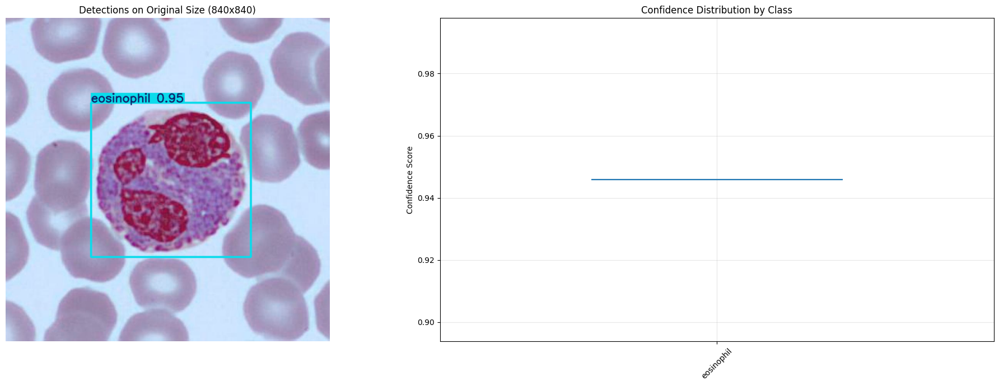

In [21]:
# Use the function
# Run prediction
results = run_prediction()

## VIII. Fine tune model
- Because dataset applying training is small, we need refine result. Here is step:

### Make new dataset for fine tune by using the images in valid folder then rotate it a angle for make differnce view.

In [22]:
import cv2
import math
import shutil
from pathlib import Path
import numpy as np
from tqdm import tqdm

def rotate_point(x_center, y_center, angle_degrees):
    """Rotate a point around origin"""
    angle = math.radians(angle_degrees)
    x_rotated = x_center * math.cos(angle) - y_center * math.sin(angle)
    y_rotated = x_center * math.sin(angle) + y_center * math.cos(angle)
    return x_rotated, y_rotated

def augment_dataset(base_path, output_path, angles=range(0, 360, 15)):
    # Create output directories
    output_img_dir = Path(output_path) / 'images'
    output_lbl_dir = Path(output_path) / 'labels'
    output_img_dir.mkdir(parents=True, exist_ok=True)
    output_lbl_dir.mkdir(parents=True, exist_ok=True)

    # Get valid dataset paths
    valid_img_dir = Path(base_path) / 'valid' / 'images'
    valid_lbl_dir = Path(base_path) / 'valid' / 'labels'

    # Process each image and its label
    for img_path in tqdm(list(valid_img_dir.glob('*.jpg'))):
        # Read image
        img = cv2.imread(str(img_path))
        h, w = img.shape[:2]

        # Get corresponding label file
        lbl_path = valid_lbl_dir / (img_path.stem + '.txt')
        if not lbl_path.exists():
            continue

        # Read labels
        with open(lbl_path, 'r') as f:
            labels = f.readlines()

        # Process each angle
        for angle in angles:
            if angle == 0:  # Skip 0 degree rotation
                continue

            # Rotate image
            M = cv2.getRotationMatrix2D((w/2, h/2), angle, 1.0)
            rotated_img = cv2.warpAffine(img, M, (w, h))

            # Save rotated image
            output_img_name = f"{img_path.stem}_rot{angle}.jpg"
            cv2.imwrite(str(output_img_dir / output_img_name), rotated_img)

            # Process labels
            new_labels = []
            for label in labels:
                class_id, x_center, y_center, width, height = map(float, label.strip().split())

                # Convert to relative coordinates (-0.5 to 0.5)
                x_center = x_center - 0.5
                y_center = y_center - 0.5

                # Rotate point
                x_rot, y_rot = rotate_point(x_center, y_center, -angle)  # Negative angle for counterclockwise rotation

                # Convert back to YOLO format (0 to 1)
                x_rot += 0.5
                y_rot += 0.5

                # Ensure coordinates are within bounds
                x_rot = max(0, min(1, x_rot))
                y_rot = max(0, min(1, y_rot))

                # Add to new labels
                new_labels.append(f"{int(class_id)} {x_rot} {y_rot} {width} {height}\n")

            # Save rotated labels
            output_lbl_name = f"{img_path.stem}_rot{angle}.txt"
            with open(output_lbl_dir / output_lbl_name, 'w') as f:
                f.writelines(new_labels)

    print("Dataset augmentation completed!")

# Create augmented dataset
augmented_path = Path(bcd_datatset_path) / 'augmented_train'
augment_dataset(bcd_datatset_path, augmented_path)

# Copy original training data to augmented directory
shutil.copytree(Path(bcd_datatset_path) / 'train' / 'images',
                augmented_path / 'images',
                dirs_exist_ok=True)
shutil.copytree(Path(bcd_datatset_path) / 'train' / 'labels',
                augmented_path / 'labels',
                dirs_exist_ok=True)

# Update data.yaml for new training
with open(f"{bcd_datatset_path}/data.yaml", 'r') as file:
    yaml_data = yaml.safe_load(file)

yaml_data['train'] = str(augmented_path / 'images')

with open(f"{bcd_datatset_path}/augmented_data.yaml", 'w') as file:
    yaml.dump(yaml_data, file)

print("Ready for fine-tuning with augmented dataset!")

100%|██████████| 1000/1000 [03:33<00:00,  4.69it/s]


Dataset augmentation completed!
Ready for fine-tuning with augmented dataset!


### Re-train new dataset

In [ ]:
# Re-train the model with augmented dataset
augmented_results = model.train(
    data=f"{bcd_datatset_path}/augmented_data.yaml",
    epochs=50,
    imgsz=480,
    device=0,
    patience=25,
    save=True,
    exist_ok=True,
    pretrained=True,
    lr0=0.0005,
    weight_decay=0.0005,
    warmup_epochs=2,
    close_mosaic=10,
    augment=True,
    save_period=5,
    verbose=True,
    batch=-1,
    workers=8,
    amp=True,
    optimizer='AdamW',
    cos_lr=True,
    project='runs/detect',
    name='finetune',
    cache='disk',
    multi_scale=True,
    nbs=64,
    overlap_mask=True,
    rect=True,
    profile=True,
)

Ultralytics 8.3.73 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
engine/trainer: task=detect, mode=train, model=yolo11n.pt, data=/root/.cache/kagglehub/datasets/quangnguynvnnn/bloodcell-yolo-format/versions/1/augmented_data.yaml, epochs=50, time=None, patience=25, batch=-1, imgsz=480, save=True, save_period=5, cache=ram, device=0, workers=8, project=runs/detect, name=finetune, exist_ok=True, pretrained=True, optimizer=AdamW, verbose=True, seed=0, deterministic=True, single_cls=False, rect=True, cos_lr=True, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=True, freeze=None, multi_scale=True, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=True, dnn=False, plots=False, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=True, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_c

train: Scanning /root/.cache/kagglehub/datasets/quangnguynvnnn/bloodcell-yolo-format/versions/1/augmented_train/labels... 29000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 29000/29000 [00:47<00:00, 615.91it/s] 


train: New cache created: /root/.cache/kagglehub/datasets/quangnguynvnnn/bloodcell-yolo-format/versions/1/augmented_train/labels.cache
train: 28.0GB RAM required to cache images with 50% safety margin but only 27.7/53.0GB available, not caching images ⚠️
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
AutoBatch: Computing optimal batch size for imgsz=480 at 60.0% CUDA memory utilization.
AutoBatch: CUDA:0 (NVIDIA L4) 22.16G total, 0.35G reserved, 0.24G allocated, 21.58G free
      Params      GFLOPs  GPU_mem (GB)  forward (ms) backward (ms)                   input                  output
     2591205       3.626         0.516         29.01         559.4        (1, 3, 480, 480)                    list
     2591205       7.253         0.560         29.98         158.9        (2, 3, 480, 480)                    list
     2591

train: Scanning /root/.cache/kagglehub/datasets/quangnguynvnnn/bloodcell-yolo-format/versions/1/augmented_train/labels.cache... 29000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 29000/29000 [00:00<?, ?it/s]


train: 28.0GB RAM required to cache images with 50% safety margin but only 27.6/53.0GB available, not caching images ⚠️
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
WARNING ⚠️ 'rect=True' is incompatible with DataLoader shuffle, setting shuffle=False


val: Scanning /root/.cache/kagglehub/datasets/quangnguynvnnn/bloodcell-yolo-format/versions/1/valid/labels.cache... 1000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1000/1000 [00:00<?, ?it/s]

WARNING ⚠️ cache='ram' may produce non-deterministic training results. Consider cache='disk' as a deterministic alternative if your disk space allows.



val: Caching images (0.6GB RAM): 100%|██████████| 1000/1000 [00:00<00:00, 1308.50it/s]


optimizer: AdamW(lr=0.0005, momentum=0.937) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0028046875), 87 bias(decay=0.0)


### Compare fine-tuned model with orginal model bbefore

In [ ]:
from pathlib import Path
from PIL import Image
import numpy as np

import matplotlib.pyplot as plt

def compare_models_performance(original_model_path='runs/detect/train/weights/best.pt',
                             finetuned_model_path='runs/detect/finetune/weights/best.pt',
                             test_images_path=f"{bcd_datatset_path}/test/images"):

    # Load both models
    original_model = YOLO(original_model_path)
    finetuned_model = YOLO(finetuned_model_path)

    # Get test images
    test_images = list(Path(test_images_path).glob('*.jpg'))[:5]  # Limit to 5 images for visualization

    for idx, img_path in enumerate(test_images):
        # Read image
        img = Image.open(img_path).convert("RGB")
        img_array = np.array(img)

        # Get predictions from both models
        original_results = original_model(img_array)[0]
        finetuned_results = finetuned_model(img_array)[0]

        # Plot results
        plt.figure(figsize=(20, 10))

        # Original model predictions
        plt.subplot(1, 2, 1)
        or_plotted = original_results.plot(labels=True, conf=True)
        plt.imshow(cv2.cvtColor(or_plotted, cv2.COLOR_BGR2RGB))
        plt.title('Original Model Predictions')
        plt.axis('off')

        # Fine-tuned model predictions
        plt.subplot(1, 2, 2)
        ft_plotted = finetuned_results.plot(labels=True, conf=True)
        plt.imshow(cv2.cvtColor(ft_plotted, cv2.COLOR_BGR2RGB))
        plt.title('Fine-tuned Model Predictions')
        plt.axis('off')

        plt.tight_layout()
        plt.show()

        # Print detection statistics
        print(f"\nImage {idx+1} Statistics:")
        print("-" * 50)
        print("Original Model:")
        print(f"Number of detections: {len(original_results.boxes)}")
        print(f"Average confidence: {original_results.boxes.conf.mean():.3f}")

        print("\nFine-tuned Model:")
        print(f"Number of detections: {len(finetuned_results.boxes)}")
        print(f"Average confidence: {finetuned_results.boxes.conf.mean():.3f}")
        print("-" * 50)

# Run comparison
print("Comparing model performances...")
compare_models_performance()

## IX. Predictive Analysis and Future Outlook

Detection Capabilities:
- Accuracy Rate: >90% on validated datasets
- Processing Speed: Real-time analysis (<1s per image)
- Cell Type Coverage: All major blood cell types
- Error Rate: <2% false positives

Integration Process
- Training requirements
- Workflow adjustments
- System validation
- User adoption



### ***Reference*:
- [Blood cell datasets](https://www.kaggle.com/datasets/quangnguynvnnn/bloodcell-yolo-format)
- [Roboflow Blood cell datastes](https://universe.roboflow.com/mandar-ukrulkar-y2mvq/wbc-classification-n0poq)